In [17]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
import json

In [2]:
user = "orange"
source = f'data/{user}/{user}_chunks/'
save_path = f'data/{user}/'

In [3]:
with open(f'{source}{user}_test_acc9.json', 'r') as f:
        data_all = json.load(f)

In [5]:
# run if the first file
data_all = data_all['rawAccelerometer'][0]
watch_pos = data_all['firstName']
print(watch_pos)
values = data_all['values']
t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

KeyError: 'rawAccelerometer'

In [4]:
# run if cont
values = data_all["cont"]

t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

KeyError: 'cont'

In [5]:
# Run if a new user but not the first acc
watch_pos = data_all['firstName']
print(watch_pos)
values = data_all['values']
t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

orange_LHand


In [6]:
acc_x = [part['x'] for i in values for part in i['samples']]
acc_y = [part['y'] for i in values for part in i['samples']]
acc_z = [part['z'] for i in values for part in i['samples']]


In [7]:

butterfly_25_shortened = np.load('butterfly_25_shortened.npy')
full_lap_butterfly_x = butterfly_25_shortened[0]
full_lap_butterfly_y = butterfly_25_shortened[1]
full_lap_butterfly_z = butterfly_25_shortened[2]

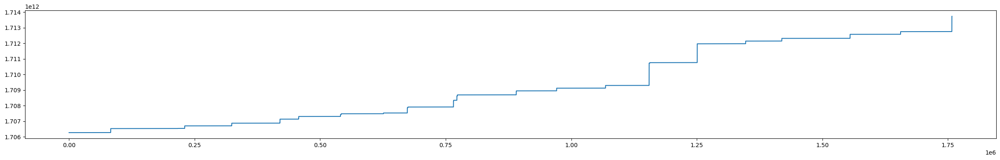

In [8]:
# Seeing how many days of data we have
# t_all is all the samples: freq*t
# This is because of data type is we have every second 
# and 25 samples for each second
second = t[1] - t[0]
freq = 25.0
period = second / freq
t_all = []
for sec in t:
    subsec = np.arange(sec, sec + second, period)
    for s in subsec:
        t_all.append(s)
fig = plt.figure(figsize=(30, 4))
plt.plot(t_all)

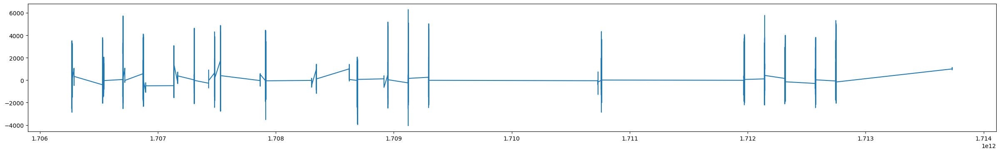

In [9]:
fig = plt.figure(figsize=(30, 4))
plt.plot(t_all, acc_x)

In [10]:
# Using datetime to change t to 
# dates and use that figure out which days
# data collection happened
from datetime import datetime, timedelta, date
import time
timestamp = time.time()
date_object = datetime.fromtimestamp(timestamp)
print("Datetime:", date_object.date())
# make a list of datetime objects showing all days data collection happened: swimming_days
current_day = date(2024, 1, 29)
swimming_days = []
finish_day = date(2024, 4, 10)
while current_day < finish_day:
    swimming_days.append(current_day)
    if current_day.weekday() == 0 or current_day.weekday() == 2:
        current_day += timedelta(days=2)
    elif current_day.weekday() == 4:
        current_day += timedelta(days=3)
    else:
        print(f'error, date {current_day} and weekday:{current_day.weekday()}')
print(f'we have {len(swimming_days)} days of swimming data')

Datetime: 2025-01-30
we have 31 days of swimming data


In [11]:
def find_indices(t_all, swimming_days):
    
    # Finding the indices of the swimming dates
    data_dates_set = set()
    # indices are index of start of a swimming day that we have data for
    indices = []
    not_swimmed_i = []
    # we might have data on days swimming not happened
    # i might've turned the watch on for some reason
    # all dates i : all the indices on the begining of the day
    # the watch collected any form of data
    all_dates_i = []
    swimming_dates_date = []
    i = 0
    for t in t_all:
        # for each t in times that swimming happened, find the date
        date_object = datetime.fromtimestamp(t/1000.0)
        # as long as there's a date to add
        tmplen = len(data_dates_set)
        data_dates_set.add(date_object.date())

        if len(data_dates_set) > tmplen:
            if date_object.date() in swimming_days:
                indices.append(i)
            else:
                not_swimmed_i.append(i)
            all_dates_i.append(i)
        i += 1
    print(f'we have at most {len(indices)} days of swimming in this batch')
    return all_dates_i, indices

In [12]:
all_dates_i, indices = find_indices(t_all, swimming_days)

we have at most 17 days of swimming in this batch


date is 2024-01-29 and index is 82950, i=1
date is 2024-01-31 and index is 230275, i=2
date is 2024-02-02 and index is 323950, i=3
date is 2024-02-05 and index is 420025, i=4
date is 2024-02-07 and index is 457275, i=5
date is 2024-02-09 and index is 541950, i=7
date is 2024-02-14 and index is 674750, i=9
date is 2024-02-19 and index is 765725, i=11
date is 2024-02-23 and index is 773275, i=13
date is 2024-02-26 and index is 890700, i=15
date is 2024-02-28 and index is 970875, i=16
date is 2024-03-01 and index is 1068225, i=17
date is 2024-03-18 and index is 1156600, i=19
date is 2024-04-01 and index is 1250800, i=20
date is 2024-04-03 and index is 1347250, i=21
date is 2024-04-05 and index is 1419250, i=22
date is 2024-04-08 and index is 1555175, i=23


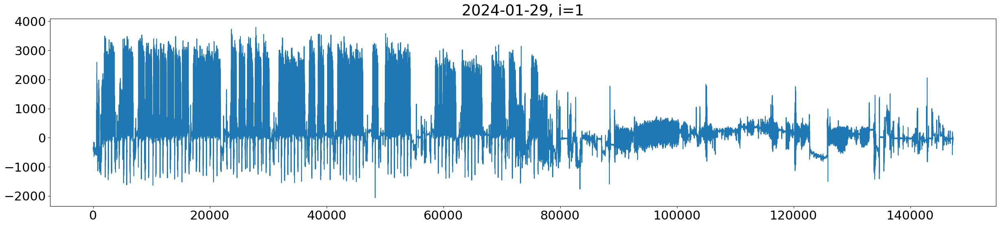

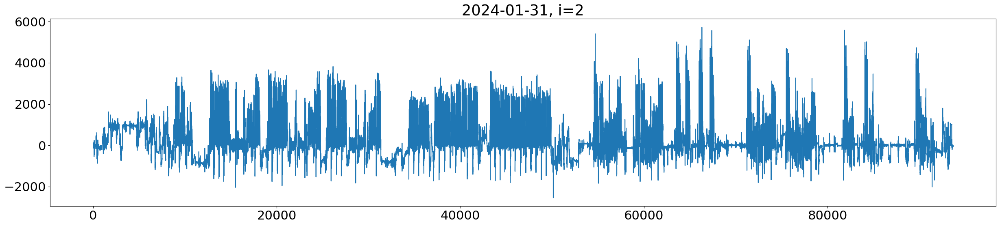

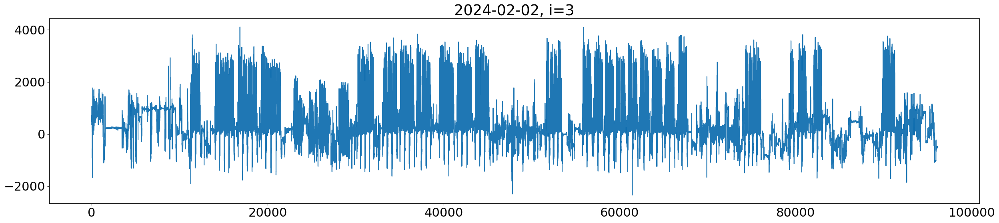

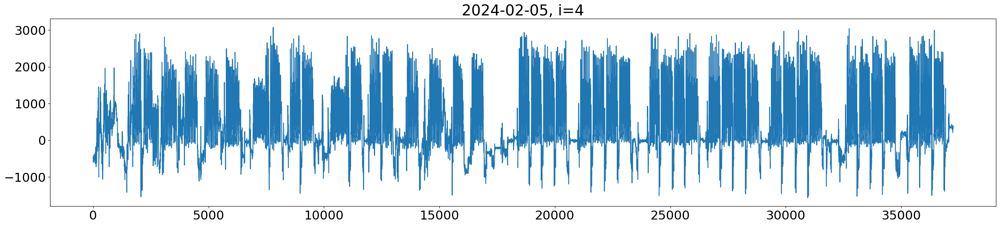

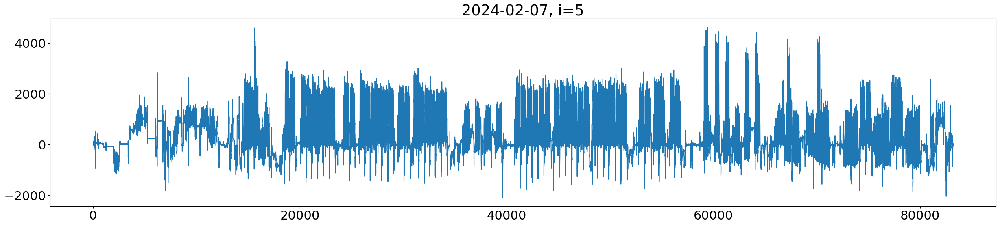

...

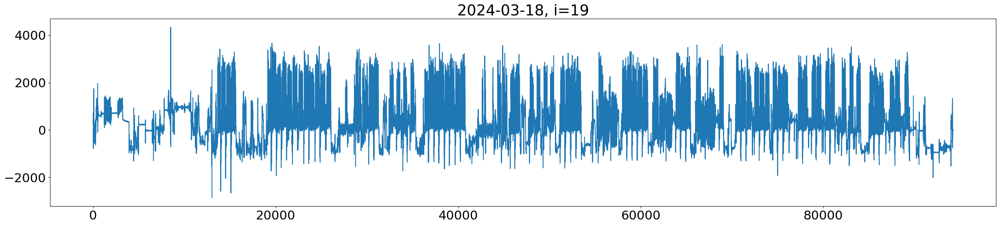

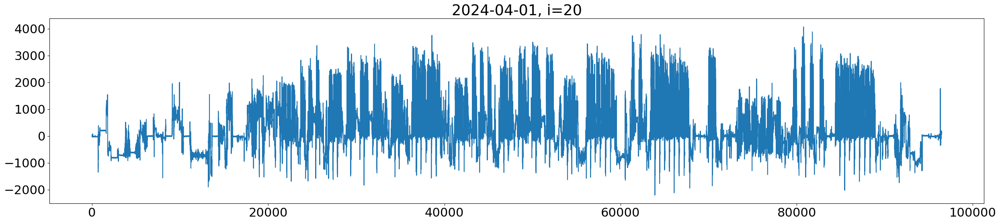

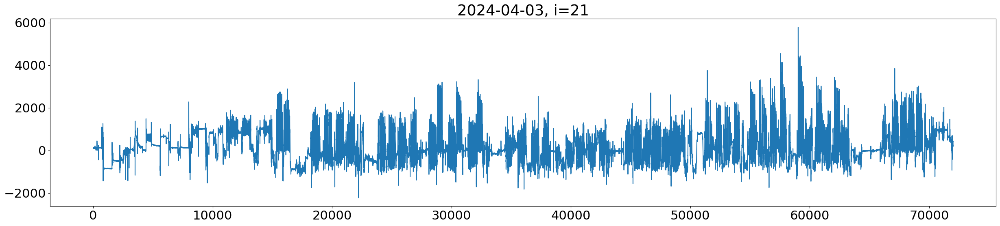

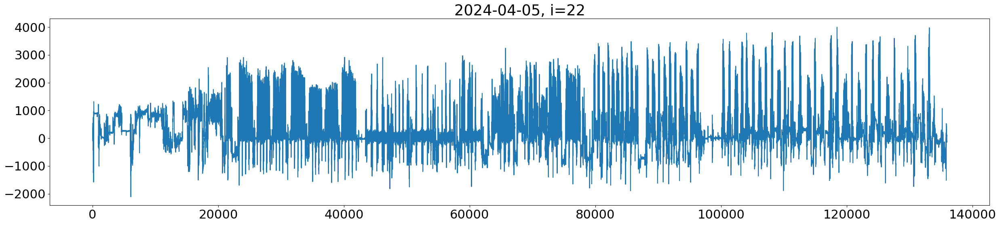

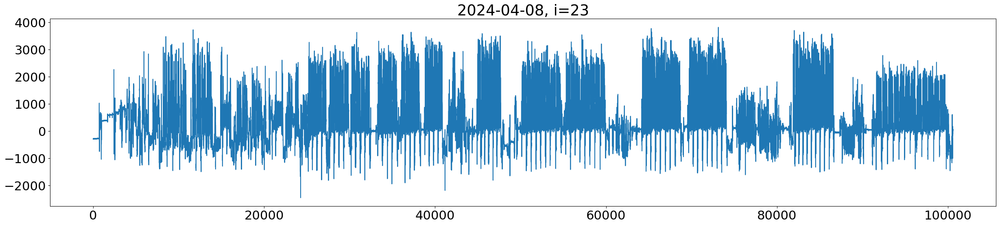

In [13]:
plt.rcParams.update({'font.size': 22})
for i in range(len(all_dates_i)):
    if i < (len(all_dates_i) - 1):
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:all_dates_i[i+1]])
            plt.title(f'{date_object.date()}, i={i}')
            print(f'date is {date_object.date()} and index is {all_dates_i[i]}, i={i}')
    else:
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:])
            plt.title(f'{date_object.date()}, i={i}')
            print(f'date is {date_object.date()} and index is {all_dates_i[i]}')

In [14]:

# I choose date: Jan 31 because it had quite a few
# Butterfly sets
index = 2

2024-01-31 06:02:53


Text(0, 0.5, 'acceleration in z')

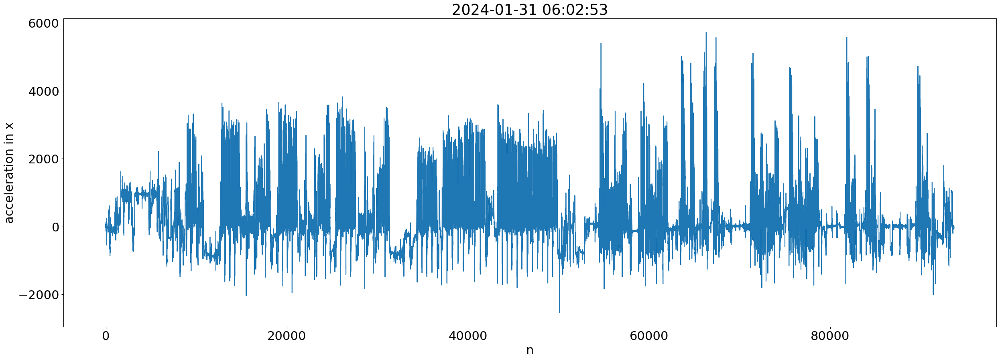

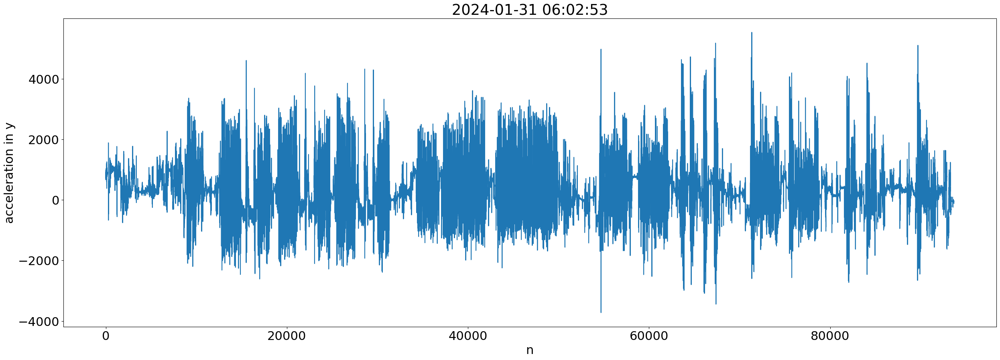

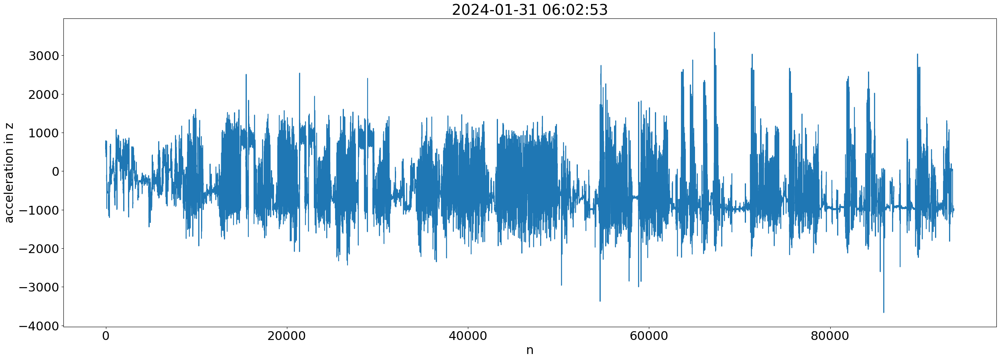

In [16]:
plt.rcParams.update({'font.size': 22})
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# butterfly_x = x[20275:20365]
# butterfly_z = z[20275:20365]
# butterfly_y = y[20275:20365]
# full_lap_butterfly_x = x[20100:20800]
# full_lap_butterfly_y = y[20100:20800]
# full_lap_butterfly_z = z[20100:20800]
start = 0
end = -(1)
fig = plt.figure(figsize=(30, 10))
plt.plot(x[start:end])
plt.title(f"{date_object}")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title(f"{date_object}")
plt.plot(y[start:end])
plt.xlabel("n")
plt.ylabel("acceleration in y")
fig = plt.figure(figsize=(30,10))
plt.plot(z[start:end])
plt.title(f"{date_object}")
plt.xlabel("n")
plt.ylabel("acceleration in z")

In [ ]:
# We already have a butterfly lap saved from Orange.
# Just gonna use correlation to find the exact indices

lagxy: 66001


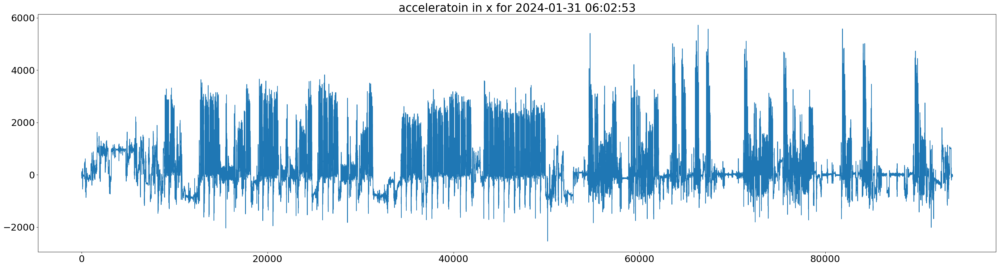

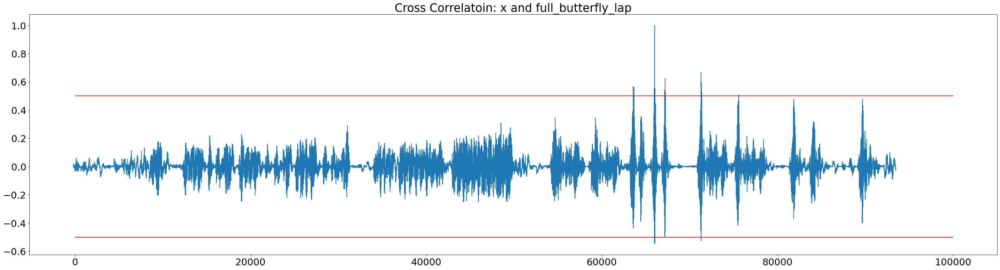

In [18]:
plt.rcParams.update({'font.size': 22})
corrx = signal.correlate((x-x.mean()), (full_lap_butterfly_x-full_lap_butterfly_x.mean()), mode="same", method="direct")
corrx = corrx /(np.max(corrx))
lags = signal.correlation_lags(len(x), len(full_lap_butterfly_x), mode="same")
lagxy = lags[np.argmax(corrx)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(x)
plt.title(f"acceleratoin in x for {date_object}")
fig = plt.figure(figsize=(40, 10))
plt.title("Cross Correlatoin: x and full_butterfly_lap")
plt.plot(lags, corrx)
plt.hlines(0.5, 0,100000,color='r')
plt.hlines(-0.5, 0,100000,color='r')

In [57]:
stroke_3_flyx = np.load("three_butterfly_strokes_x.npy")



lagxy: 66088


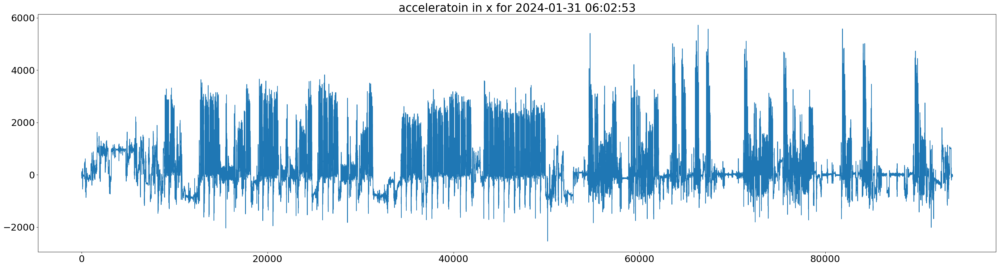

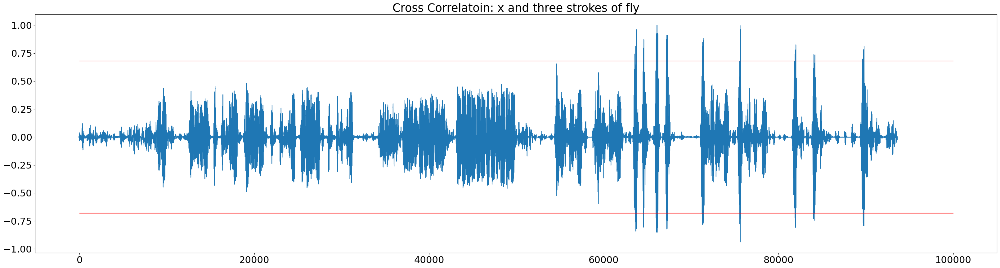

In [24]:
plt.rcParams.update({'font.size': 22})
corrx = signal.correlate((x-x.mean()), (stroke_3_flyx-stroke_3_flyx.mean()), mode="same", method="direct")
corrx = corrx /(np.max(corrx))
lags = signal.correlation_lags(len(x), len(stroke_3_flyx), mode="same")
lagxy = lags[np.argmax(corrx)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(x)
plt.title(f"acceleratoin in x for {date_object}")
fig = plt.figure(figsize=(40, 10))
plt.title("Cross Correlatoin: x and three strokes of fly")
plt.plot(lags, corrx)
plt.hlines(0.68, 0,100000,color='r')
plt.hlines(-0.68, 0,100000,color='r')

In [25]:
# Finding the indices where the butterfly starts by finding where
# correlation is greater than a threshold
fly_suspect = [i for i in lags[np.where(np.abs(corrx)>0.68)]]
fly_suspect.insert(0, 0)
potential_i_fly = []
for j in range(len(fly_suspect)):
    if fly_suspect[j] - fly_suspect[j-1] > 300:
        potential_i_fly.append(fly_suspect[j])
print(f'fly detected: {len(potential_i_fly)}')


fly detected: 9


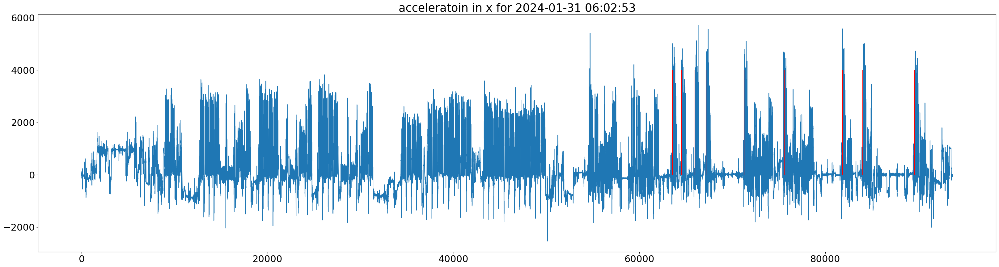

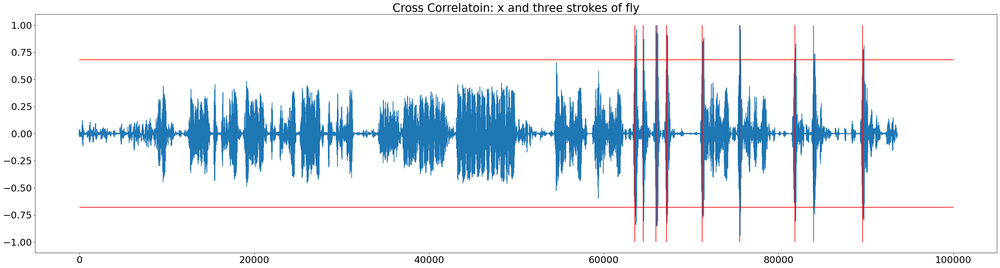

In [28]:
fig = plt.figure(figsize=(40, 10))
plt.plot(x)
plt.vlines(potential_i_fly, 0, 4000, color='r')
plt.title(f"acceleratoin in x for {date_object}")
fig = plt.figure(figsize=(40, 10))
plt.title("Cross Correlatoin: x and three strokes of fly")
plt.plot(lags, corrx)
plt.hlines(0.68, 0,100000,color='r')
plt.hlines(-0.68, 0,100000,color='r')
plt.vlines(potential_i_fly, -1, 1, color='r')

In [35]:
# For graph purposes
points_chosen = []
for i in range(len(potential_i_fly)):
    tmp = potential_i_fly[i] - potential_i_fly[0] + 100
    points_chosen.append(tmp)

Text(0.5, 0, 'n')

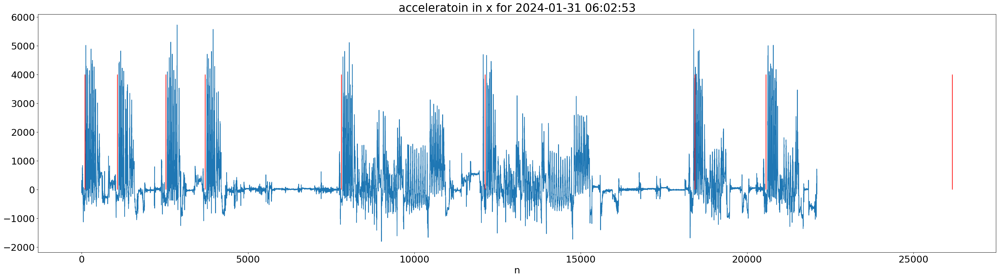

In [42]:
fig = plt.figure(figsize=(40, 10))
plt.plot(x[(potential_i_fly[0]-100):(potential_i_fly[0]+22000)])
plt.vlines(points_chosen, 0, 4000, color='r')
plt.title(f"acceleratoin in x for {date_object}")
plt.xlabel("n")



In [45]:
# For graph purposes
points_chosen = []
for i in range((len(potential_i_fly)-6)):
    tmp = potential_i_fly[i+6] - potential_i_fly[6] + 100
    points_chosen.append(tmp)

Text(0.5, 0, 'n')

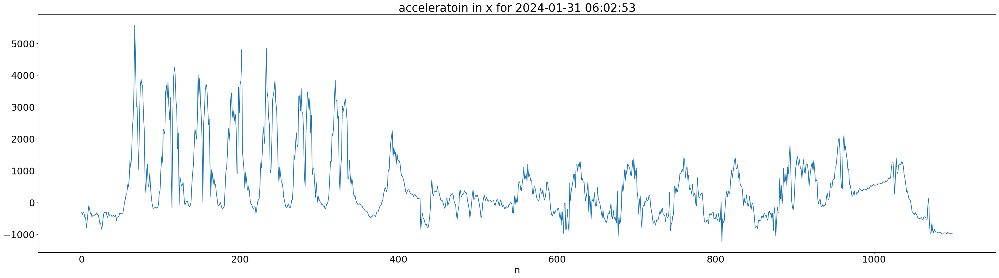

In [49]:
fig = plt.figure(figsize=(40, 10))
plt.plot(x[(potential_i_fly[6]-100):(potential_i_fly[6]+1000)])
plt.vlines(points_chosen[0], 0, 4000, color='r')
plt.title(f"acceleratoin in x for {date_object}")
plt.xlabel("n")


In [50]:
# Manually changing this to include the first stroke
potential_i_fly[6] = potential_i_fly[6] - 100

Text(0.5, 0, 'n')

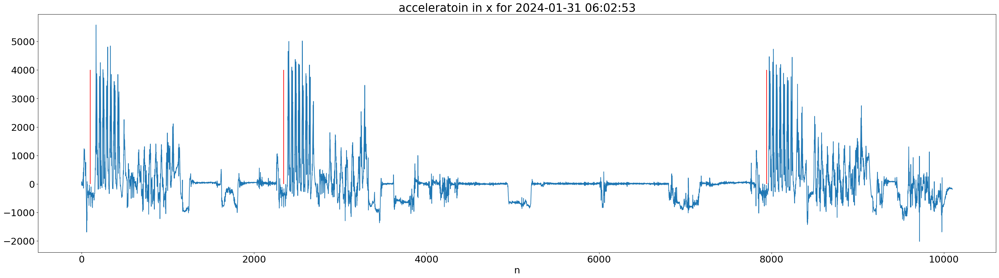

In [53]:
# For graph purposes
points_chosen = []
for i in range((len(potential_i_fly)-6)):
    tmp = potential_i_fly[i+6] - potential_i_fly[6] + 100
    points_chosen.append(tmp)
fig = plt.figure(figsize=(40, 10))
plt.plot(x[(potential_i_fly[6]-100):(potential_i_fly[6]+10000)])
plt.vlines(points_chosen, 0, 4000, color='r')
plt.title(f"acceleratoin in x for {date_object}")
plt.xlabel("n")

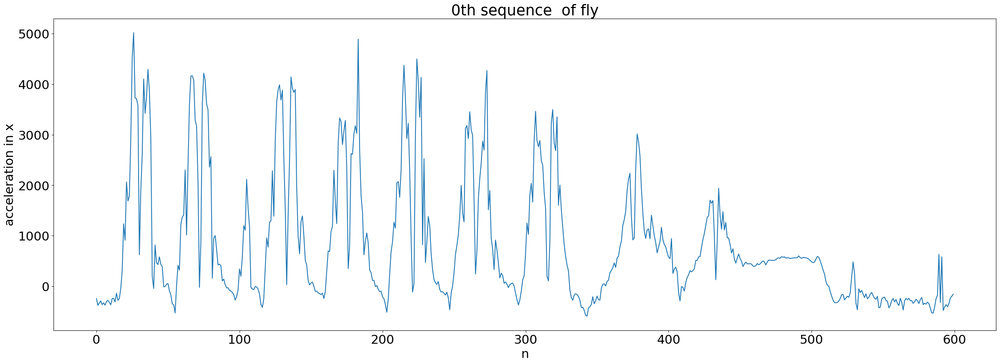

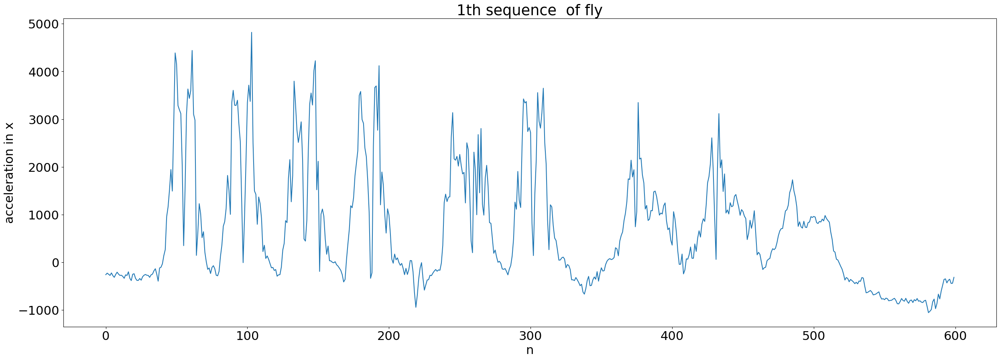

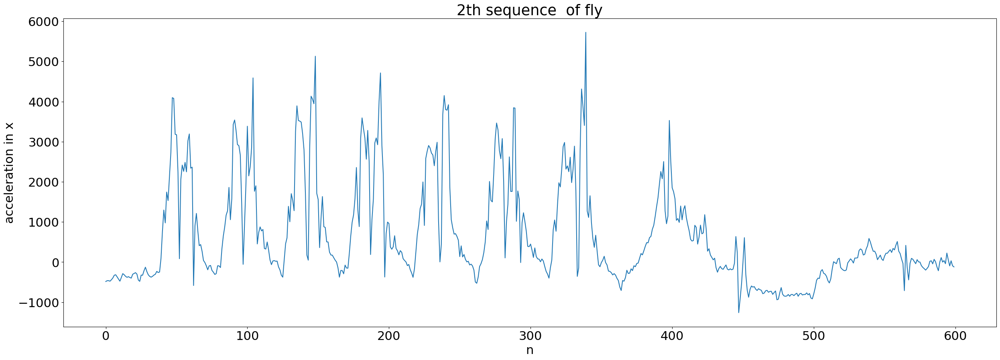

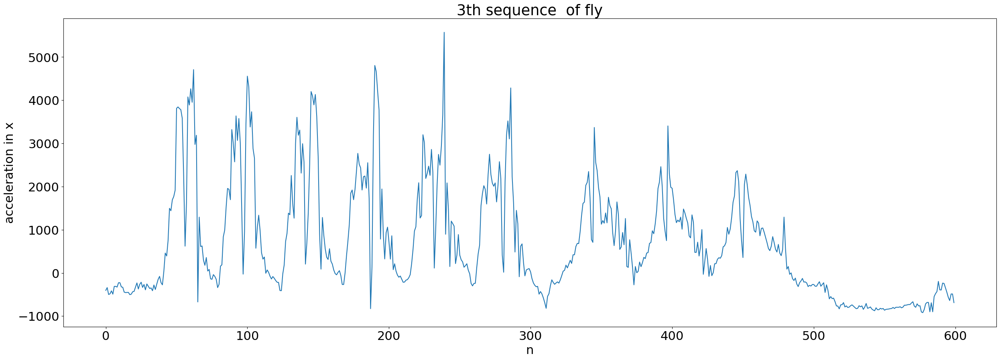

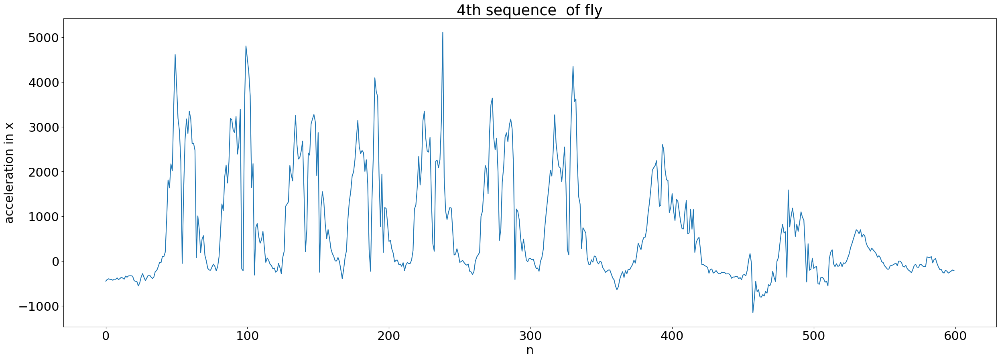

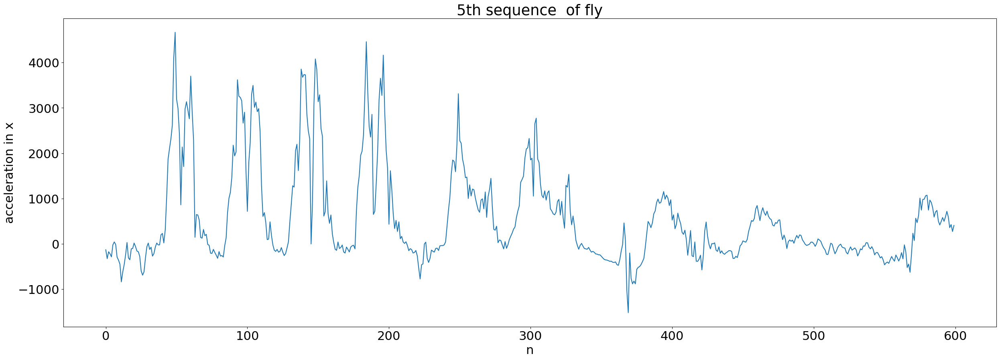

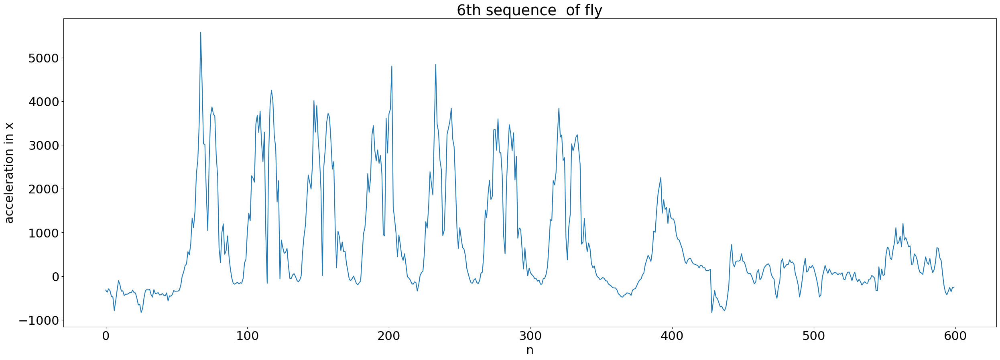

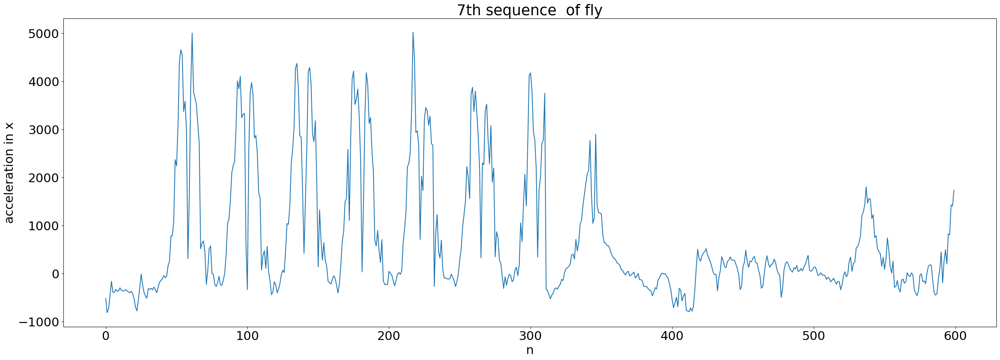

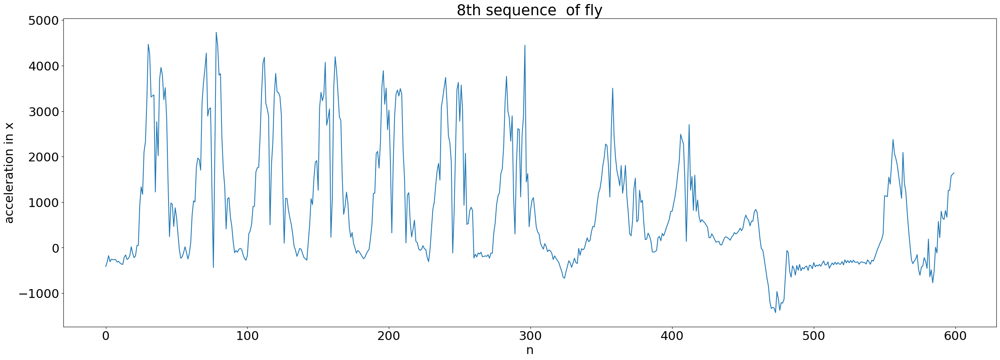

In [54]:
plt.rcParams.update({'font.size': 22})
chosen_length= 600
fly_x = np.zeros((len(potential_i_fly), chosen_length))
fly_y = np.zeros((len(potential_i_fly), chosen_length))
fly_z = np.zeros((len(potential_i_fly), chosen_length))
count = 0
for i_fly in potential_i_fly:
    fig = plt.figure(figsize=(30, 10))
    plt.plot(x[i_fly:(i_fly+600)])
    fly_x[count, :] = x[i_fly:(i_fly+600)]
    fly_y[count, :] = y[i_fly:(i_fly+600)]
    fly_z[count, :] = z[i_fly:(i_fly+600)]
    plt.title(f"{count}th sequence  of fly")
    count += 1
    
    plt.xlabel("n")
    plt.ylabel("acceleration in x")

In [ ]:
# I choose that each time you need to do three strokes for
# the model to  detect you are doing a certain style


len of three strokes: 150


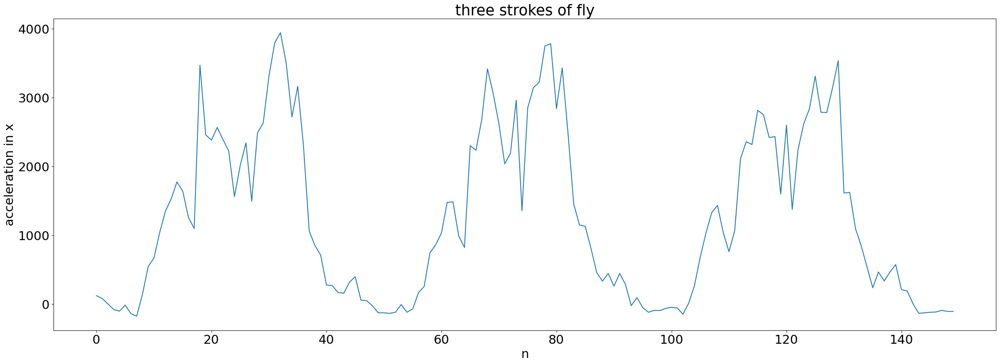

In [62]:
fig = plt.figure(figsize=(30, 10))
plt.plot(stroke_3_flyx)
plt.title("three strokes of fly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
print(f'len of three strokes: {len(stroke_3_flyx)}')

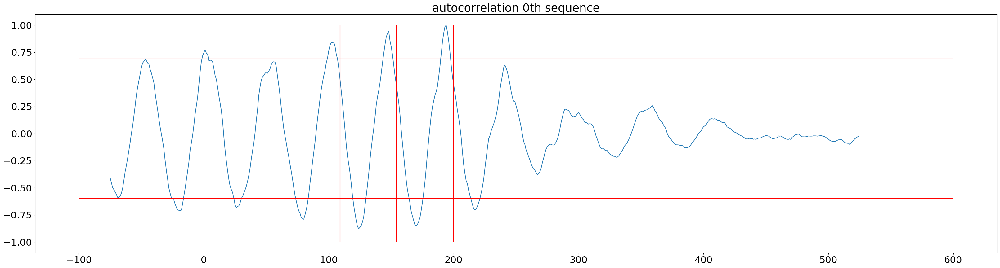

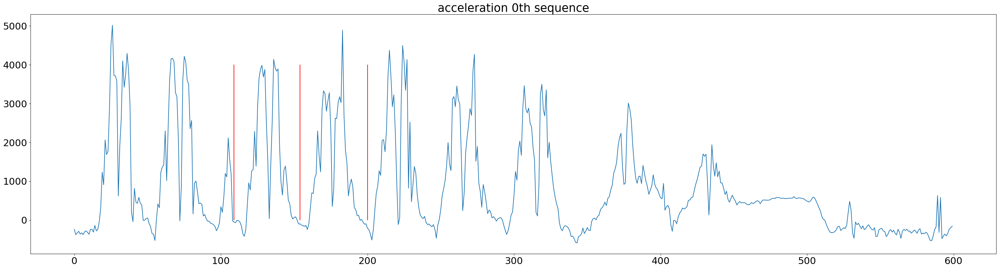

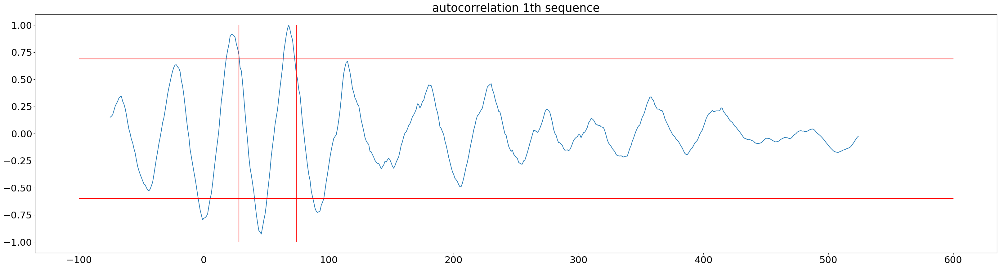

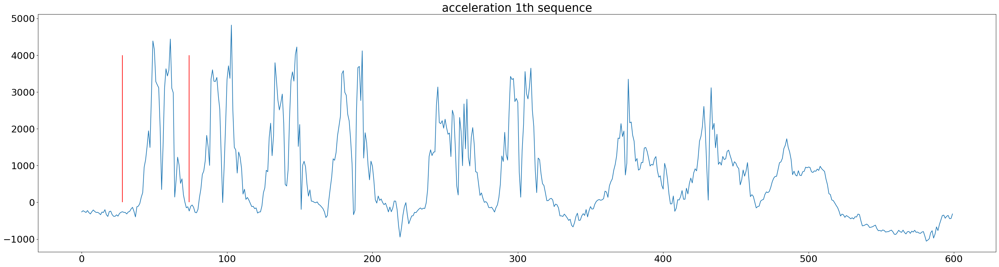

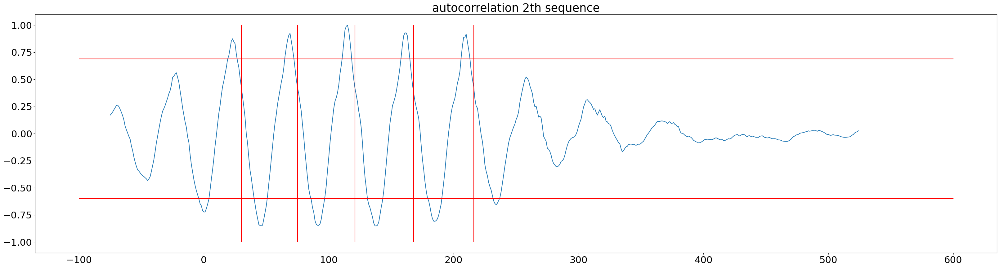

...

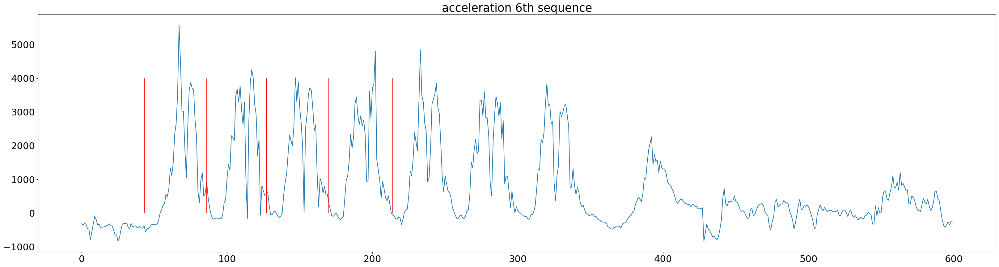

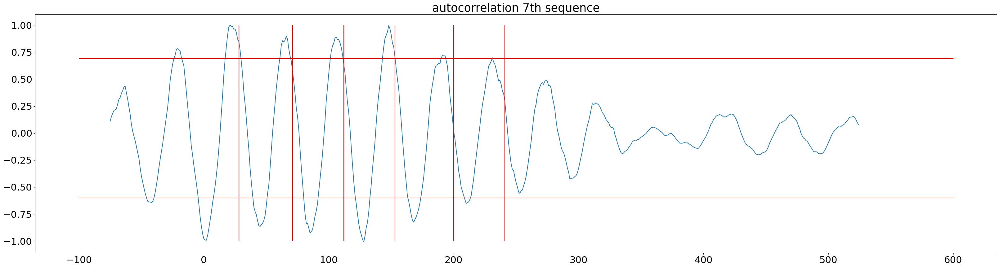

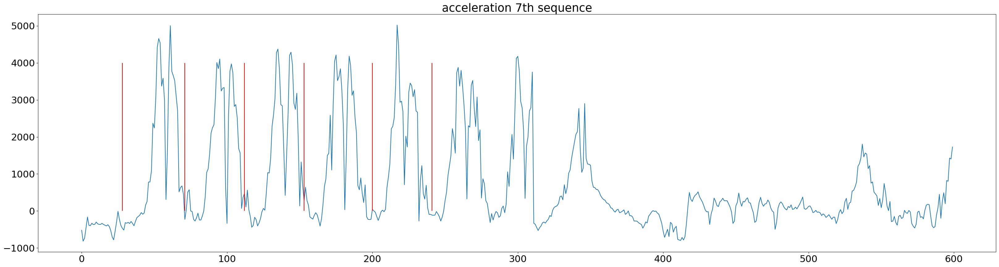

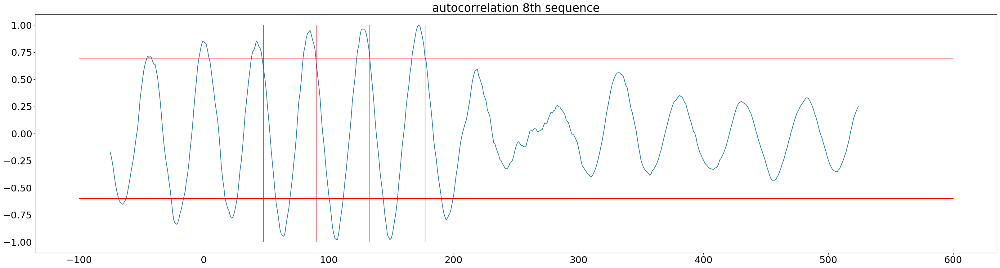

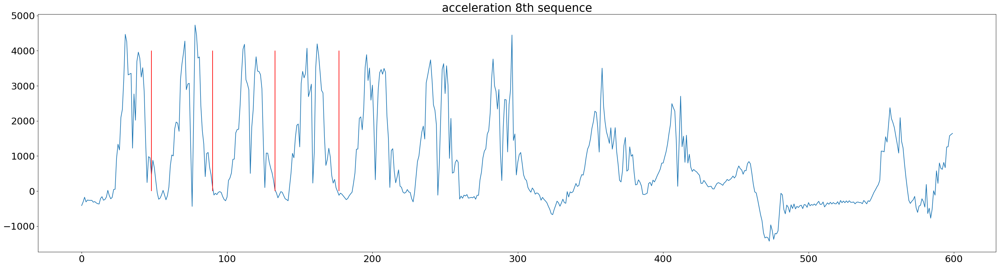

In [69]:
# trying to find the indices of 3 consecutive flys
# so that we can store them
i_fly_stroke = []
for k in range(len(fly_x)):
    temp_stroke = []
    corr_stroke = signal.correlate((fly_x[k]-fly_x[k].mean()), (stroke_3_flyx-stroke_3_flyx.mean()), mode="same", method="direct")
    corr_stroke = corr_stroke / np.max(corr_stroke)
    lags = signal.correlation_lags(len(fly_x[k]), len(stroke_3_flyx), mode="same")
    flystroke_suspect = [i for i in lags[np.where(corr_stroke>0.69)]]
    #print(corr_stroke)
    # print(f'{flystroke_suspect} for k={k}' )
    # print(f'{lags[np.where(corr_stroke>0.72)]} for k={k}')
    flystroke_suspect.insert(0, -150)
    for j in range(len(flystroke_suspect)):
        if flystroke_suspect[j] - flystroke_suspect[j-1] > 28:
            if flystroke_suspect[j] > 0:
                # I think we need a small shift for better data
                tmp = flystroke_suspect[j] + 10
                temp_stroke.append(tmp)
    i_fly_stroke.append(temp_stroke)
    fig = plt.figure(figsize=(40, 10))
    plt.plot(lags, corr_stroke)
    plt.title(f'autocorrelation {k}th sequence')
    plt.hlines(0.69, -100,600,color='r')
    plt.hlines(-0.60, -100,600,color='r')
    plt.vlines(temp_stroke, -1, 1, color='r')
    fig = plt.figure(figsize=(40, 10))
    plt.plot(fly_x[k])
    plt.vlines(temp_stroke, 0, 4000, color='r')
    plt.title(f'acceleration {k}th sequence')

In [70]:
i_fly_stroke

[[109, 154, 200],
 [28, 74],
 [30, 75, 121, 168, 216],
 [29, 74, 120, 166],
 [28, 73, 119, 165, 211],
 [31, 77, 128],
 [43, 86, 127, 170, 214],
 [28, 71, 112, 153, 200, 241],
 [48, 90, 133, 177]]

In [71]:
#manually amending some data points:
i_fly_stroke[0].insert(0,0)
i_fly_stroke

[[0, 109, 154, 200],
 [28, 74],
 [30, 75, 121, 168, 216],
 [29, 74, 120, 166],
 [28, 73, 119, 165, 211],
 [31, 77, 128],
 [43, 86, 127, 170, 214],
 [28, 71, 112, 153, 200, 241],
 [48, 90, 133, 177]]

In [72]:
count = 0
for i in i_fly_stroke:
    count += len(i)
count
#how many data seq are we getting

38

In [73]:
fly_data1 = []
for k in range(len(i_fly_stroke)):
    num_strokes = len(i_fly_stroke[k])
    temp = []
    for p in range(num_strokes):
        if p < (num_strokes - 3):
            full_fly = np.stack((fly_x[k][i_fly_stroke[k][p]:i_fly_stroke[k][p+3]],
                                 fly_y[k][i_fly_stroke[k][p]:i_fly_stroke[k][p+3]], 
                                 fly_x[k][i_fly_stroke[k][p]:i_fly_stroke[k][p+3]]))
            #print(f'full_flyshape: {full_fly.shape}')
            full_fly = np.transpose(full_fly)
            #print(f'after: {full_fly.shape}')
            fly_data1.append(full_fly)
        else:
            if len(fly_x[k]) > (i_fly_stroke[k][p] + 150):
                full_fly = np.stack((fly_x[k][i_fly_stroke[k][p]:(i_fly_stroke[k][p]+150)],
                                     fly_y[k][i_fly_stroke[k][p]:(i_fly_stroke[k][p]+150)], 
                                     fly_x[k][i_fly_stroke[k][p]:(i_fly_stroke[k][p]+150)]))
                #print(f'full_flyshape: {full_fly.shape}')
                full_fly = np.transpose(full_fly)
                #print(f'after: {full_fly.shape}')
                fly_data1.append(full_fly)

In [74]:
len(fly_data1)

38

In [77]:
# 146 samples of data: (acceleration in x, acceleration in y, acceleration in z)
fly_data1[6].shape

(138, 3)

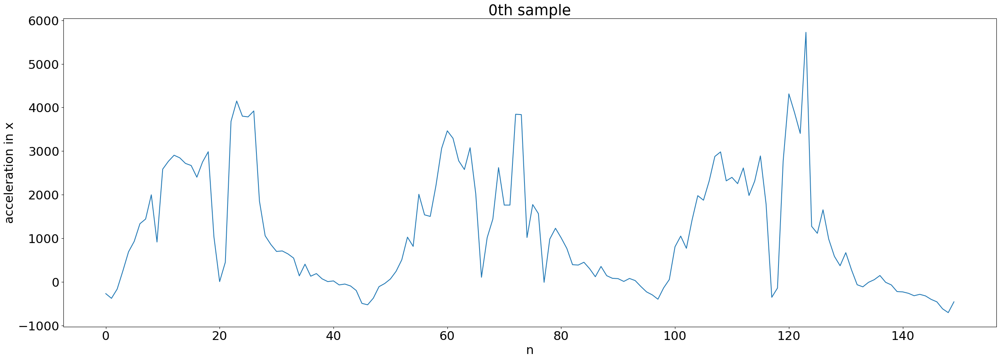

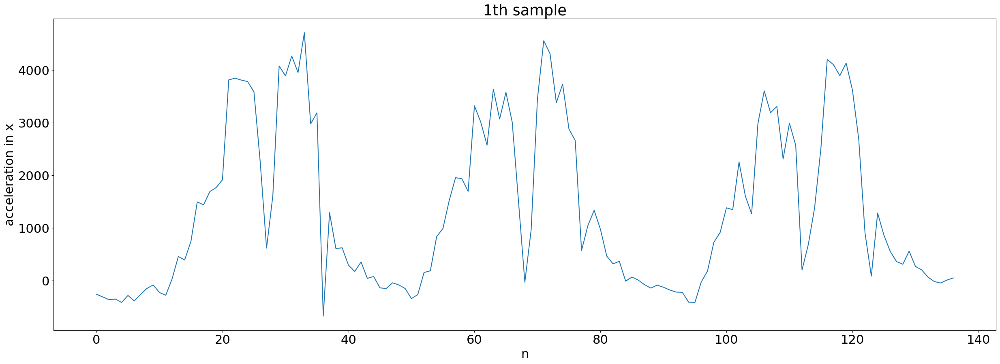

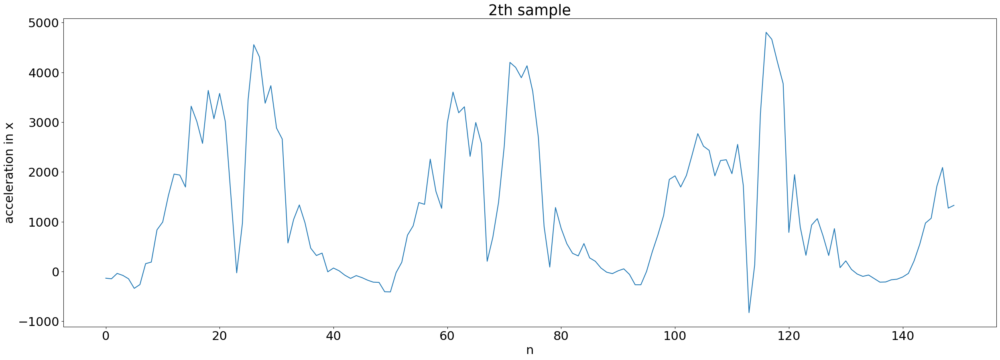

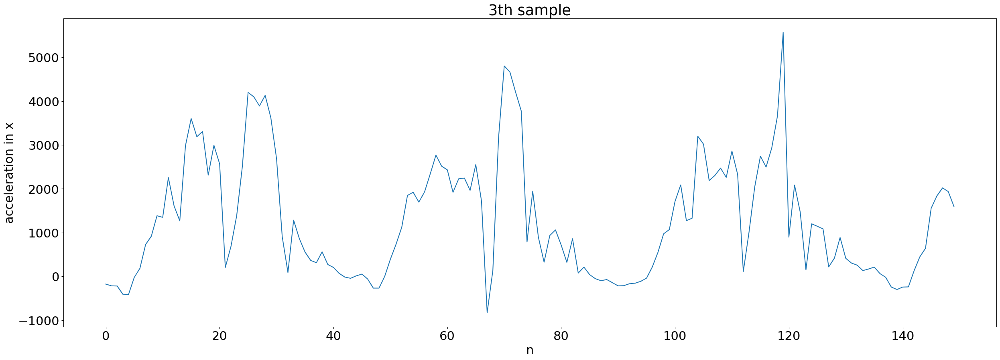

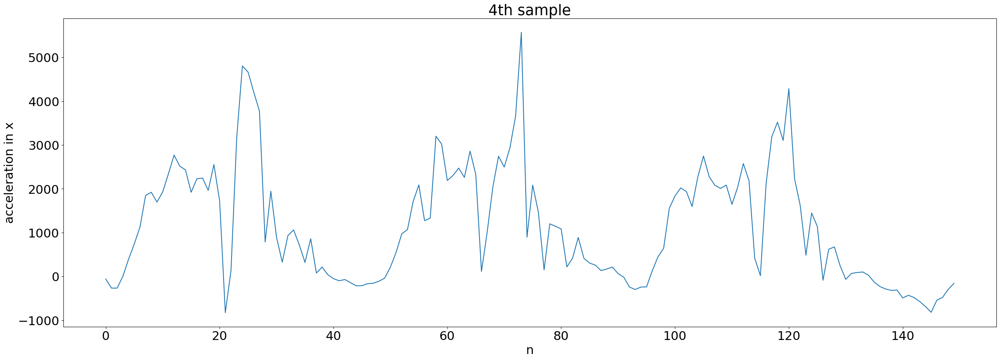

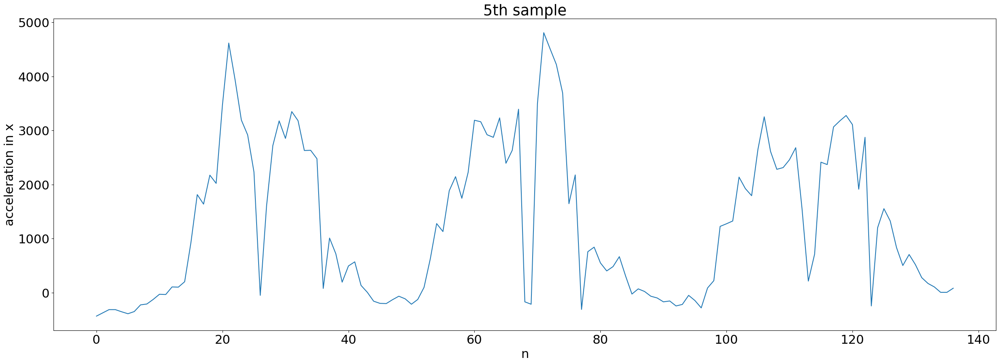

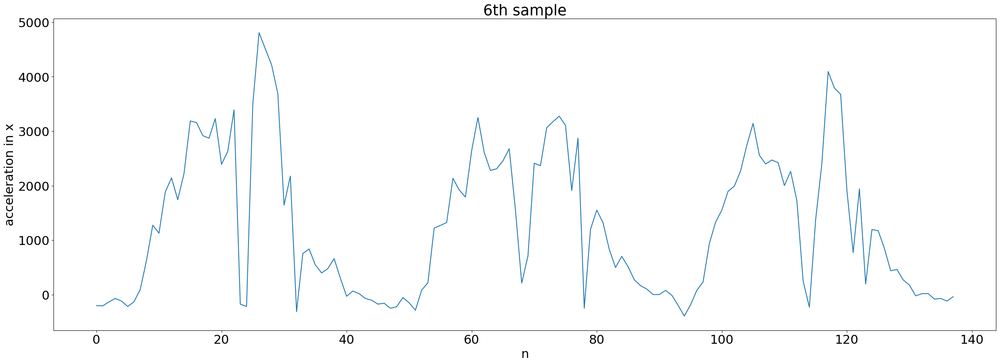

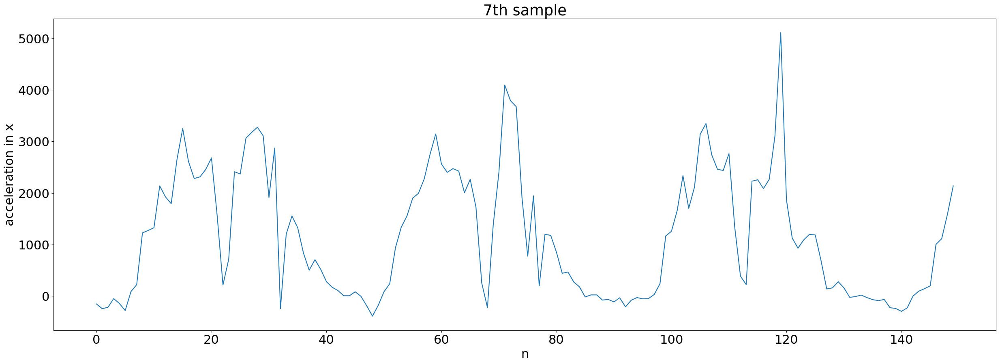

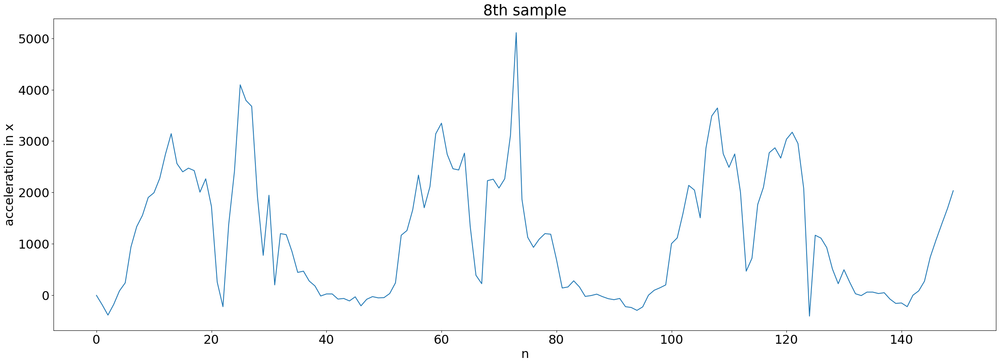

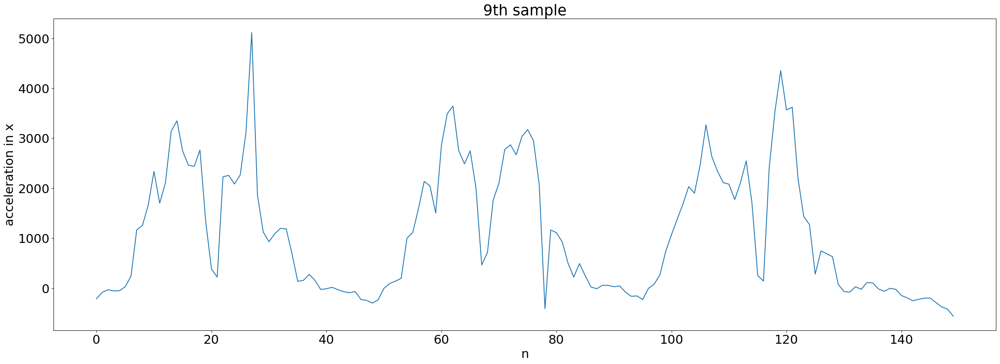

In [78]:
for i in range(10):
    plt.rcParams.update({'font.size': 22})
    fig = plt.figure(figsize=(30, 10))
    plt.plot(np.transpose(fly_data1[i+10])[0])
    plt.title(f"{i}th sample")
    plt.ylabel("acceleration in x")
    plt.xlabel("n")

In [79]:
np.savez("orange_38_fly.npz", *fly_data1)

The rest are for butterfly selection

2024-01-31 06:02:53


Text(0, 0.5, 'acceleration in y')

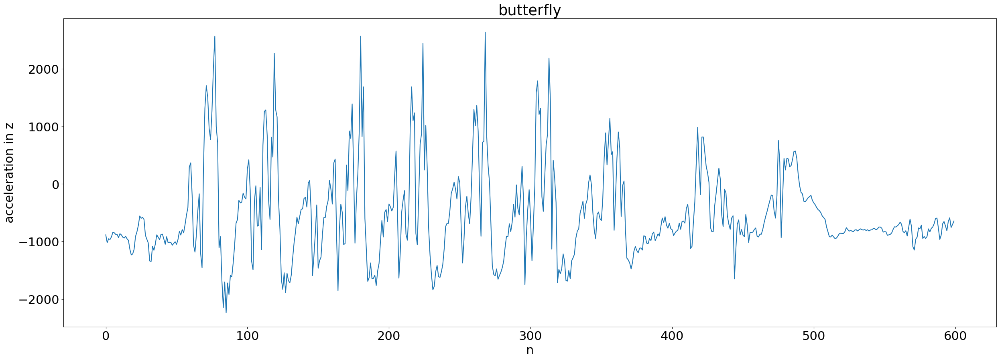

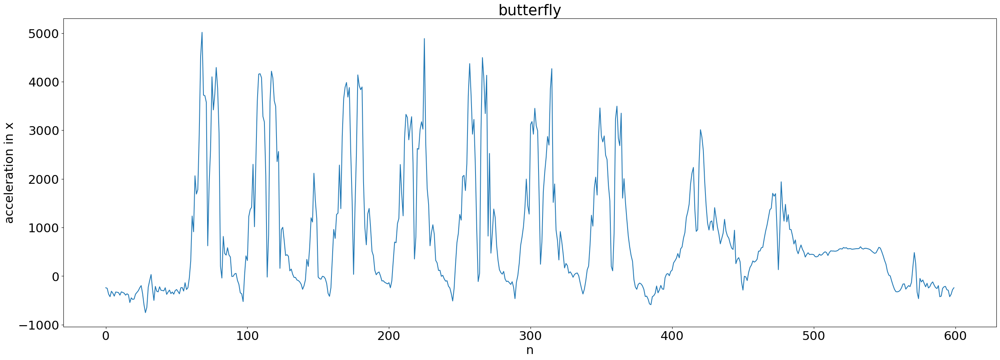

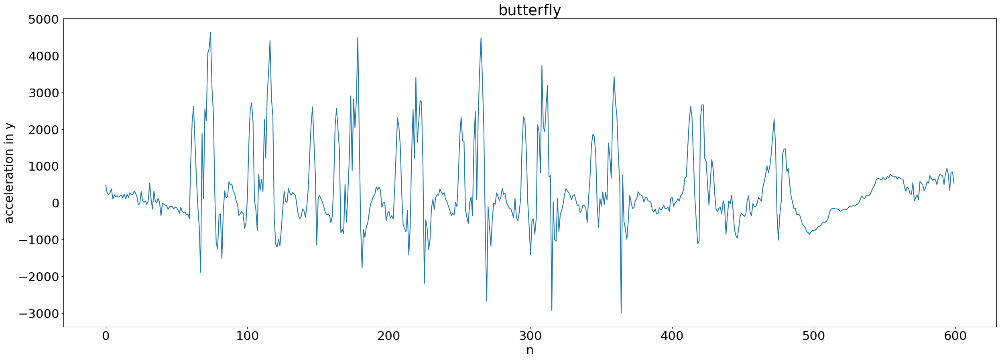

In [27]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
index = 2
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
# z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
# y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
# x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# butterfly_x = x[20275:20365]
# butterfly_z = z[20275:20365]
# butterfly_y = y[20275:20365]
start =53500 + 10000
end = start + 600
full_lap_butterfly_x = x[start:end]
full_lap_butterfly_y = y[start:end]
full_lap_butterfly_z = z[start:end]

plt.plot(z[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title("butterfly")
plt.plot(y[start:end])
plt.xlabel("n")
plt.ylabel("acceleration in y")

2024-01-31 06:02:53


Text(0, 0.5, 'acceleration in y')

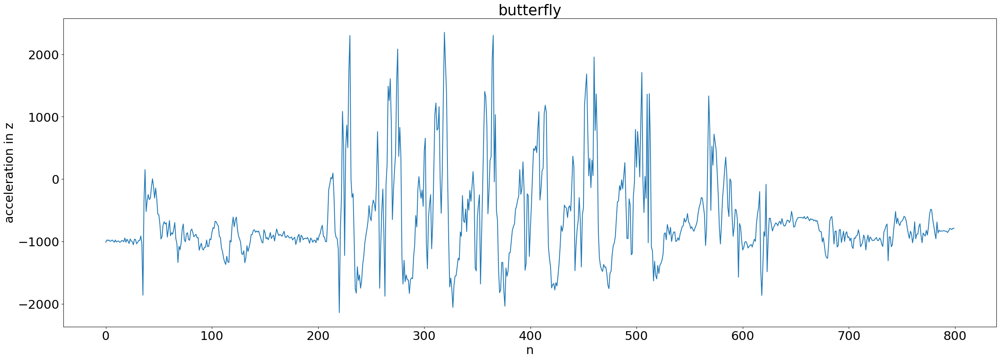

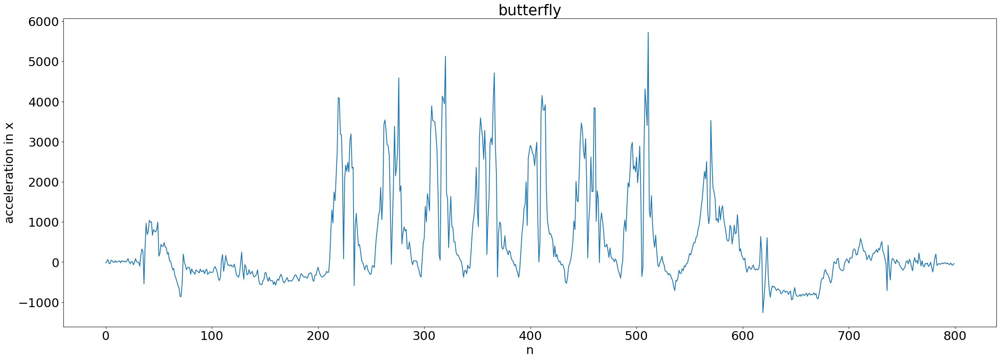

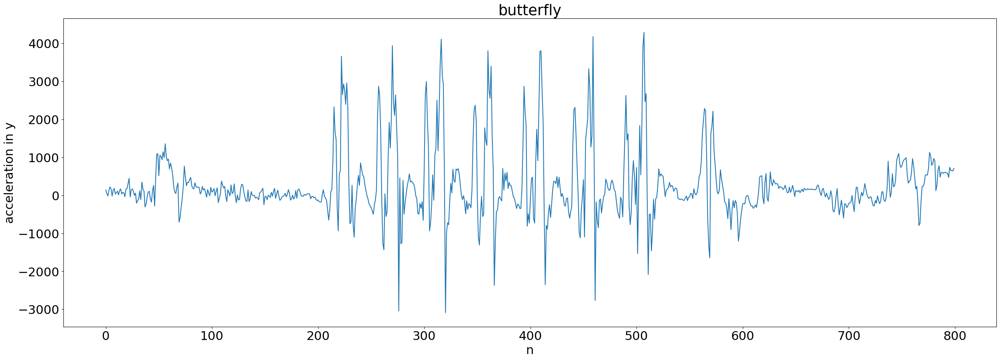

In [40]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
index = 2
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
# z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
# y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
# x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# butterfly_x = x[20275:20365]
# butterfly_z = z[20275:20365]
# butterfly_y = y[20275:20365]
start = 53000 + 12800
end = start + 800
full_lap_butterfly_x = x[start:end]
full_lap_butterfly_y = y[start:end]
full_lap_butterfly_z = z[start:end]
# butterly_25 = np.stack((full_lap_butterfly_x, full_lap_butterfly_y, full_lap_butterfly_z), axis = 0)
# np.save('butterfly_25.npy', butterly_25)
plt.plot(z[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title("butterfly")
plt.plot(y[start:end])
plt.xlabel("n")
plt.ylabel("acceleration in y")

2024-01-31 06:02:53


Text(0, 0.5, 'acceleration in y')

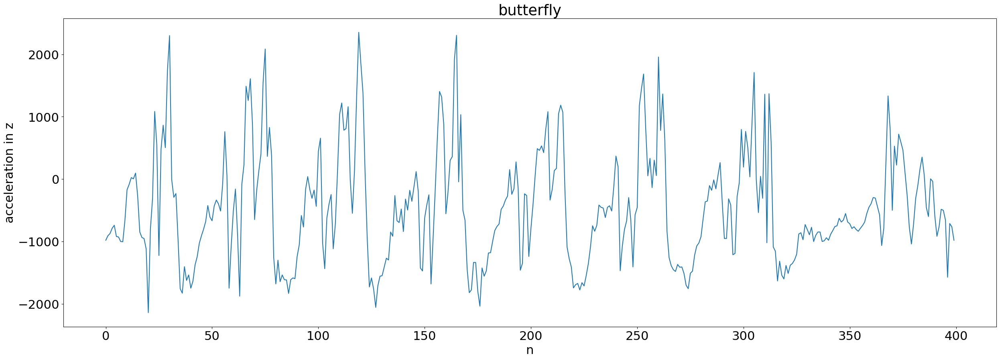

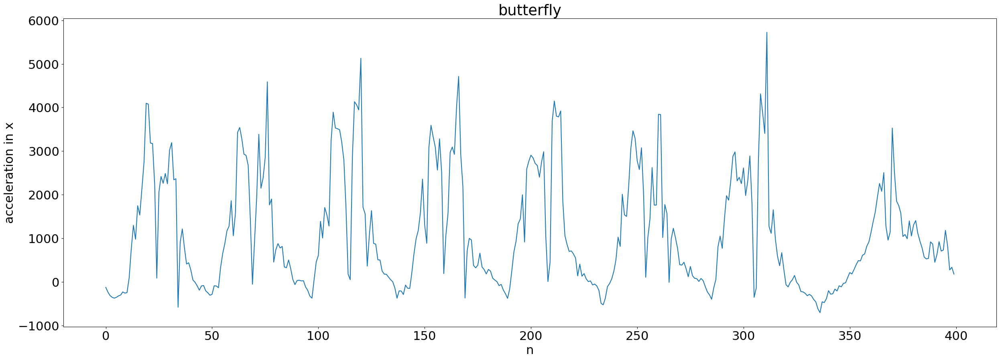

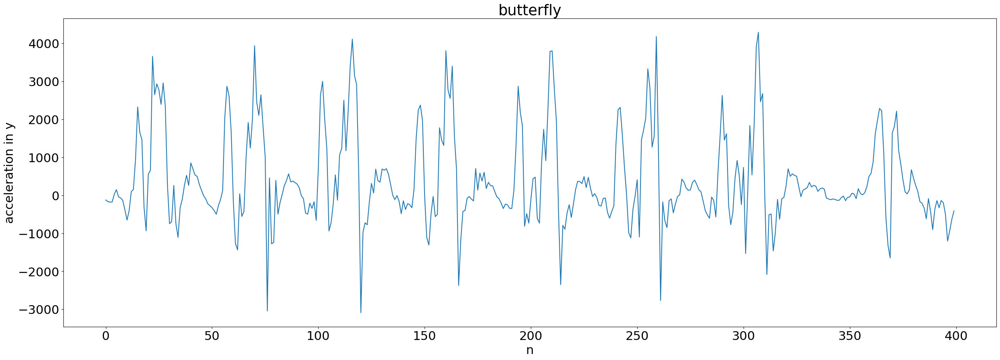

In [42]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
index = 2
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
# z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
# y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
# x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# butterfly_x = x[20275:20365]
# butterfly_z = z[20275:20365]
# butterfly_y = y[20275:20365]
start = 53000 + 13000
end = start + 400
full_lap_butterfly_x = x[start:end]
full_lap_butterfly_y = y[start:end]
full_lap_butterfly_z = z[start:end]
# butterly_25_shortened = np.stack((full_lap_butterfly_x, full_lap_butterfly_y, full_lap_butterfly_z), axis = 0)
# np.save('butterfly_25_shortened.npy', butterly_25_shortened)
plt.plot(z[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title("butterfly")
plt.plot(y[start:end])
plt.xlabel("n")
plt.ylabel("acceleration in y")

lagxy: 66001


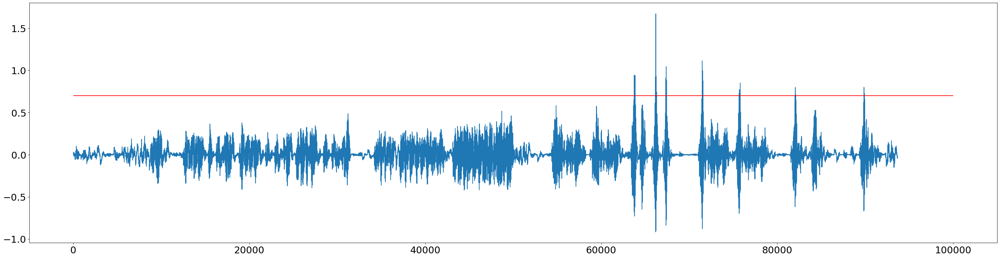

In [43]:
from scipy import signal

corrxy = signal.correlate((x-x.mean()), (full_lap_butterfly_x-full_lap_butterfly_x.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(x)*np.std(full_lap_butterfly_x)*len(full_lap_butterfly_x))
lags = signal.correlation_lags(len(x), len(full_lap_butterfly_x), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)
plt.hlines(0.70, 0,100000,color='r')

In [47]:
lags[np.where(corrxy>0.70)]

array([63604, 63649, 63650, 63651, 65954, 65955, 65999, 66000, 66001,
       66002, 66003, 66047, 66048, 67182, 67183, 67184, 67185, 67228,
       67229, 71319, 71320, 71321, 71366])

In [88]:
lagxy

array([75900])

lagxy: 66001


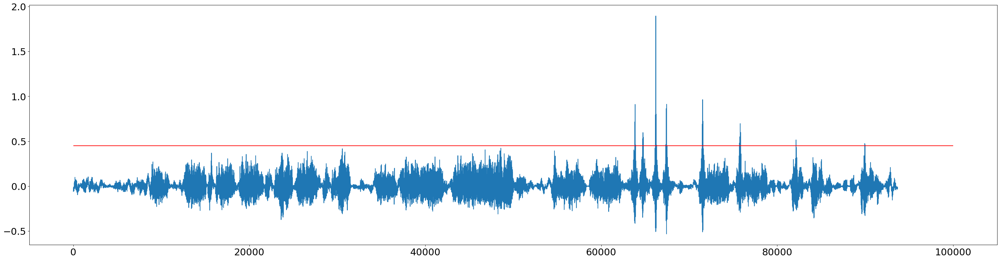

In [46]:
from scipy import signal

corrxy = signal.correlate((y-y.mean()), (full_lap_butterfly_y-full_lap_butterfly_y.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(y)*np.std(full_lap_butterfly_y)*len(full_lap_butterfly_y))
lags = signal.correlation_lags(len(y), len(full_lap_butterfly_y), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)
plt.hlines(0.45, 0,100000,color='r')

lagxy: 66001


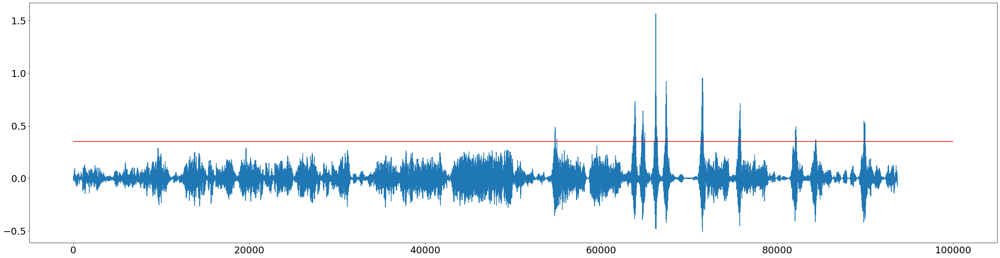

In [45]:
from scipy import signal

corrxy = signal.correlate((z-z.mean()), (full_lap_butterfly_z-full_lap_butterfly_z.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(z)*np.std(full_lap_butterfly_z)*len(full_lap_butterfly_z))
lags = signal.correlation_lags(len(z), len(full_lap_butterfly_z), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)
plt.hlines(0.35, 0,100000,color='r')

lagxy: 72900


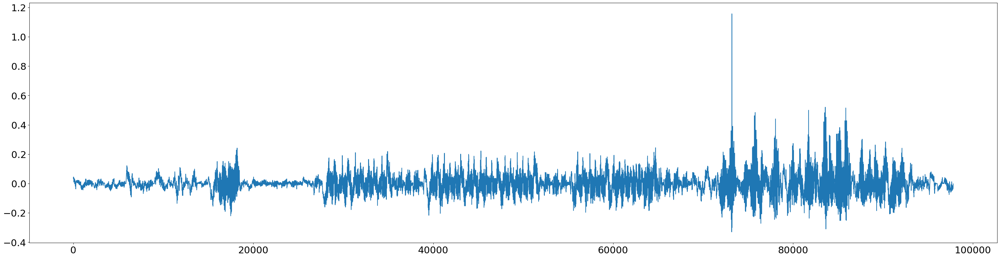

In [71]:
from scipy import signal

corrxy = signal.correlate((x-x.mean()), (full_lap_butterfly_x-full_lap_butterfly_x.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(x)*np.std(full_lap_butterfly_x)*len(full_lap_butterfly_x))
lags = signal.correlation_lags(len(x), len(full_lap_butterfly_x), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

lagxy: 20192


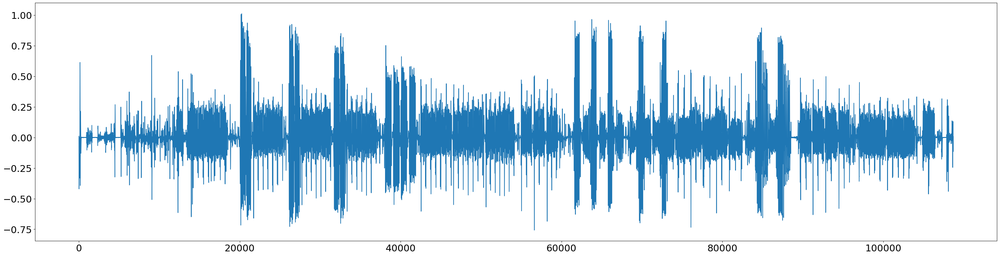

In [58]:
from scipy import signal

corrxy = signal.correlate((x-x.mean()), (butterfly_x-butterfly_x.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(x)*np.std(butterfly_x)*len(butterfly_x))
lags = signal.correlation_lags(len(x), len(butterfly_x), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

lagxy: 87116


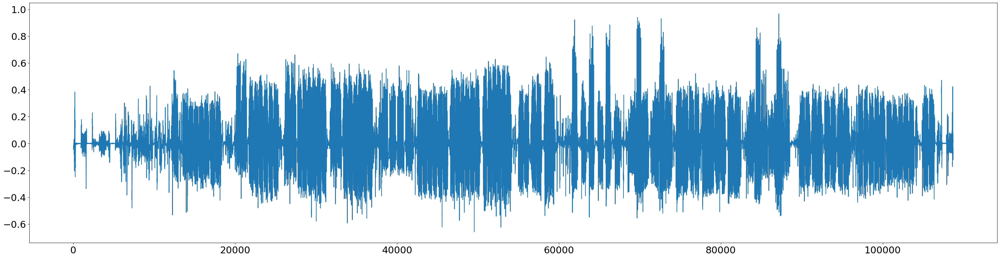

In [51]:

corrxy = signal.correlate((y-y.mean()), (butterfly_y-butterfly_y.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(y)*np.std(butterfly_y)*len(butterfly_y))
lags = signal.correlation_lags(len(y), len(butterfly_y), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

lagxy: 72755


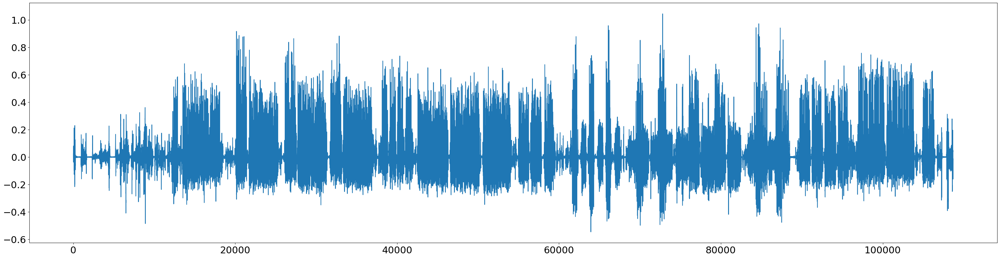

In [53]:
corrxy = signal.correlate((z-z.mean()), (butterfly_z-butterfly_z.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(z)*np.std(butterfly_z)*len(butterfly_z))
lags = signal.correlation_lags(len(z), len(butterfly_z), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

2024-02-07 05:53:13


Text(0, 0.5, 'acceleration in y')

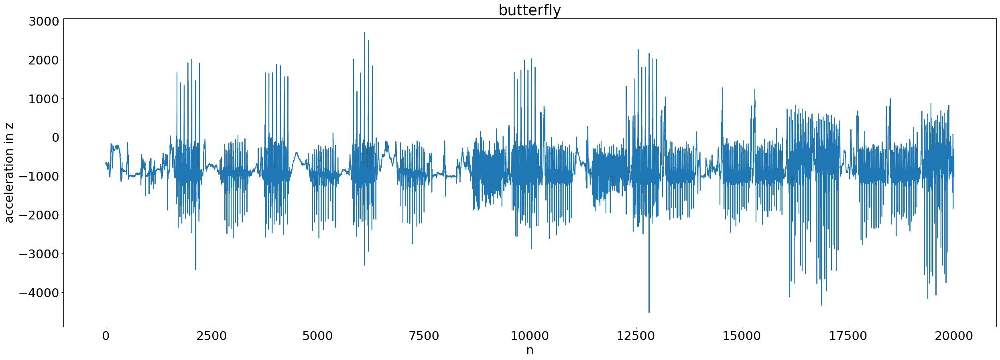

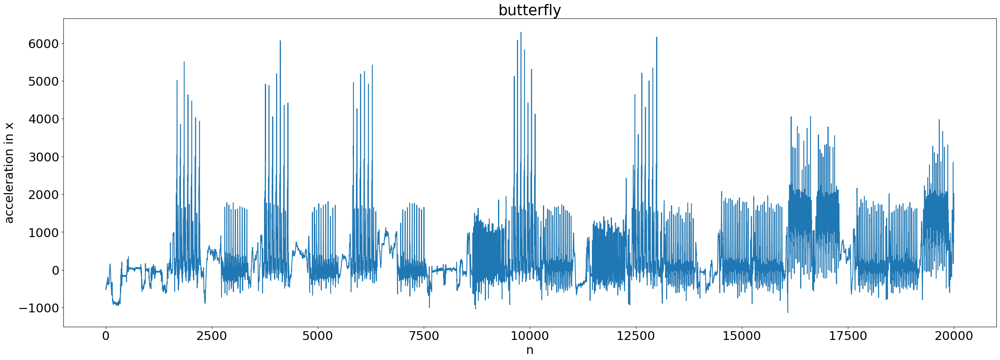

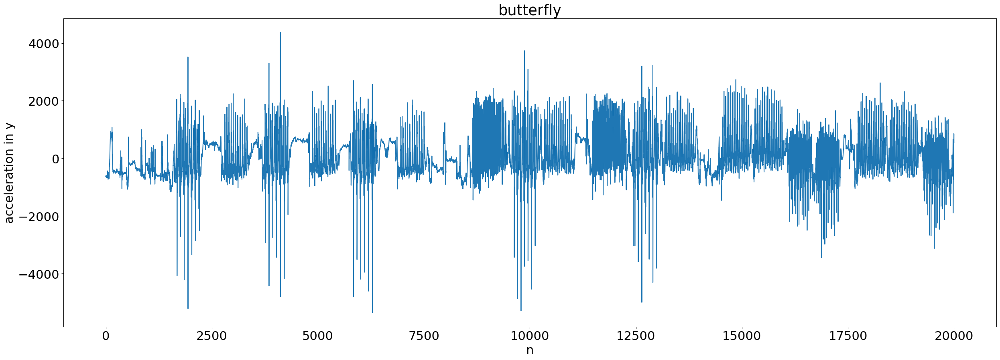

In [54]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
index = 4
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
z = np.array(acc_z[all_dates_i[4]:all_dates_i[5]])
y = np.array(acc_y[all_dates_i[4]:all_dates_i[5]])
x = np.array(acc_x[all_dates_i[4]:all_dates_i[5]])
butterfly_x = x[20275:20365]
butterfly_z = z[20275:20365]
butterfly_y = y[20275:20365]
plt.plot(z[60000:80000])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[60000:80000])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title("butterfly")
plt.plot(y[60000:80000])
plt.xlabel("n")
plt.ylabel("acceleration in y")

Text(0, 0.5, 'acceleration in y')

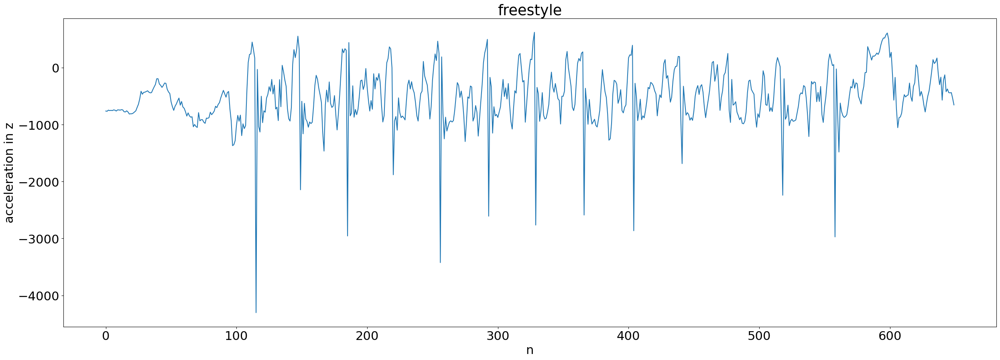

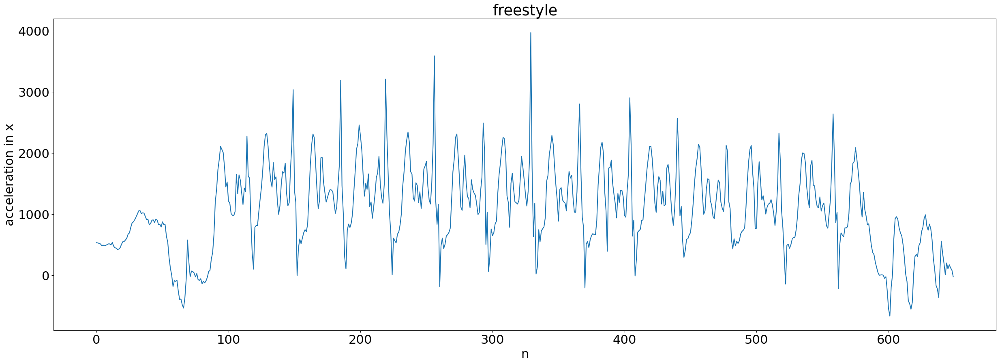

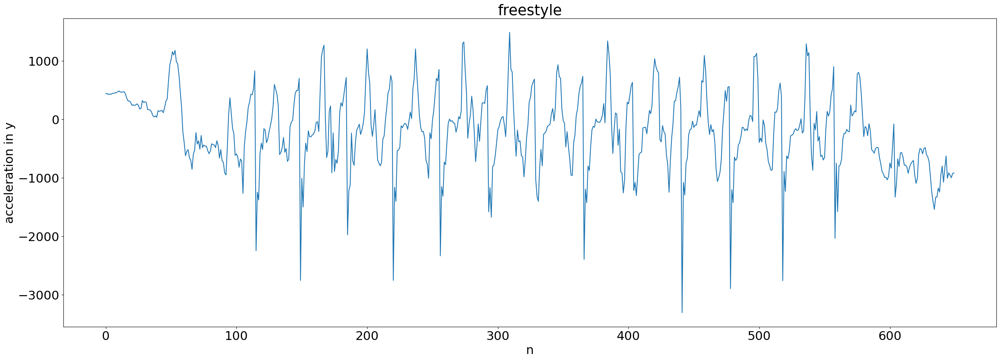

In [19]:
fig = plt.figure(figsize=(30, 10))
z = acc_z[all_dates_i[4]:all_dates_i[5]]
y = acc_y[all_dates_i[4]:all_dates_i[5]]
x = acc_x[all_dates_i[4]:all_dates_i[5]]
plt.plot(z[21650:22300])
plt.title("freestyle")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[21650:22300])
plt.title("freestyle")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30, 10))
plt.title("freestyle")
plt.plot(y[21650:22300])
plt.xlabel("n")
plt.ylabel("acceleration in y")

In [ ]:
fig = plt.figure(figsize=(30, 6))
plt.plot(acc_z[all_dates_i[9]:all_dates_i[10]])

In [ ]:
track